In [256]:
# Load The Libraries:-
import numpy as np 
import seaborn as sns 
import pandas as pd 
import matplotlib.pyplot as plt 
import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline

In [257]:
# Load The Dataset:- 

df = pd.read_csv('D:\python developer\machinelearning\data_set\penguins_lter.csv')
df.head()

,studyName,Sample Number,Species,Region,Island,Stage,Individual ID,Clutch Completion,Date Egg,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex,Delta 15 N (o/oo),Delta 13 C (o/oo),Comments
0,PAL0708,1,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N1A1,Yes,11/11/07,39.1,18.7,181.0,3750.0,MALE,NaN,NaN,Not enough blood for isotopes.
1,PAL0708,2,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N1A2,Yes,11/11/07,39.5,17.4,186.0,3800.0,FEMALE,8.94956,-24.69454,NaN
2,PAL0708,3,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N2A1,Yes,11/16/07,40.3,18.0,195.0,3250.0,FEMALE,8.36821,-25.33302,NaN
3,PAL0708,4,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N2A2,Yes,11/16/07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Adult not sampled.
4,PAL0708,5,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N3A1,Yes,11/16/07,36.7,19.3,193.0,3450.0,FEMALE,8.76651,-25.32426,NaN


In [258]:
# Data Cleaning:- 

df.isnull().sum()

studyName                0
Sample Number            0
Species                  0
Region                   0
Island                   0
Stage                    0
Individual ID            0
Clutch Completion        0
Date Egg                 0
Culmen Length (mm)       2
Culmen Depth (mm)        2
Flipper Length (mm)      2
Body Mass (g)            2
Sex                     10
Delta 15 N (o/oo)       14
Delta 13 C (o/oo)       13
Comments               318
dtype: int64

In [259]:
df.columns

Index(['studyName', 'Sample Number', 'Species', 'Region', 'Island', 'Stage',
       'Individual ID', 'Clutch Completion', 'Date Egg', 'Culmen Length (mm)',
       'Culmen Depth (mm)', 'Flipper Length (mm)', 'Body Mass (g)', 'Sex',
       'Delta 15 N (o/oo)', 'Delta 13 C (o/oo)', 'Comments'],
      dtype='object')

In [260]:
# Remove Unexpected Columns:- 
df.drop(columns=['studyName','Sample Number','Region','Stage','Individual ID','Clutch Completion','Date Egg','Delta 15 N (o/oo)','Delta 13 C (o/oo)','Comments'],axis=1,inplace=True)

In [261]:
df.Species.unique()

array(['Adelie Penguin (Pygoscelis adeliae)',
       'Chinstrap penguin (Pygoscelis antarctica)',
       'Gentoo penguin (Pygoscelis papua)'], dtype=object)

In [262]:
df.Island.unique()

array(['Torgersen', 'Biscoe', 'Dream'], dtype=object)

In [263]:
df.head()

,Species,Island,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex
0,Adelie Penguin (Pygoscelis adeliae),Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie Penguin (Pygoscelis adeliae),Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie Penguin (Pygoscelis adeliae),Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie Penguin (Pygoscelis adeliae),Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie Penguin (Pygoscelis adeliae),Torgersen,36.7,19.3,193.0,3450.0,FEMALE


In [264]:
df.isnull().sum()

Species                 0
Island                  0
Culmen Length (mm)      2
Culmen Depth (mm)       2
Flipper Length (mm)     2
Body Mass (g)           2
Sex                    10
dtype: int64

In [265]:
df[df['Sex'] =='.']

,Species,Island,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex
336,Gentoo penguin (Pygoscelis papua),Biscoe,44.5,15.7,217.0,4875.0,.


In [266]:
df.at[336,'Sex'] = 'FEMALE'

In [267]:
df.loc[336]

Species                Gentoo penguin (Pygoscelis papua)
Island                                            Biscoe
Culmen Length (mm)                                  44.5
Culmen Depth (mm)                                   15.7
Flipper Length (mm)                                217.0
Body Mass (g)                                     4875.0
Sex                                               FEMALE
Name: 336, dtype: object

<Axes: ylabel='count'>

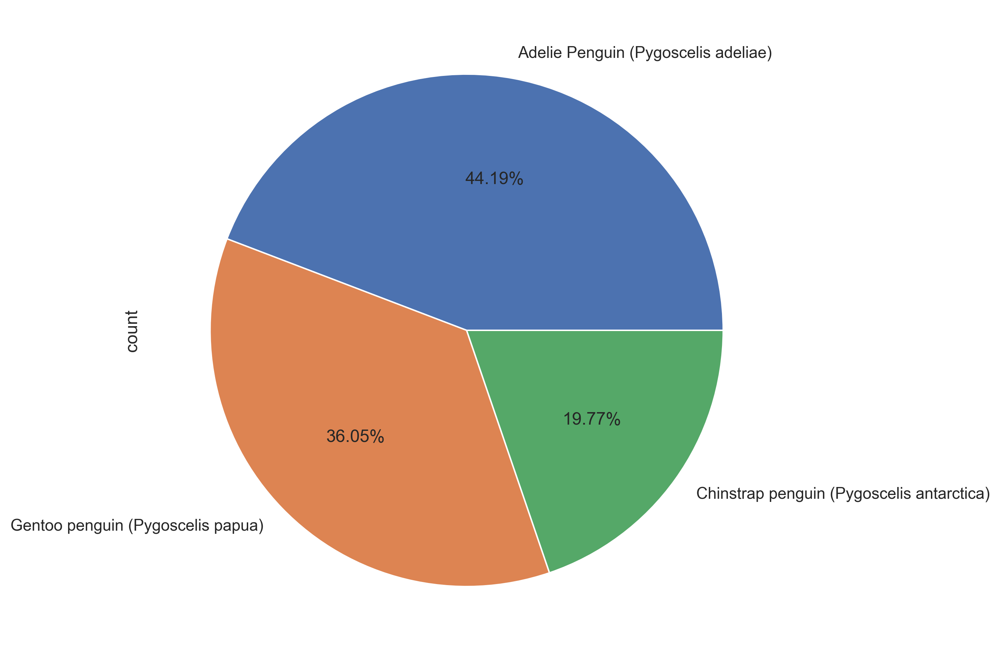

In [268]:
# Number of Species based on categories
Species=df.Species.value_counts()
Species.plot(kind='pie',autopct="%.2f%%")

<Axes: ylabel='count'>

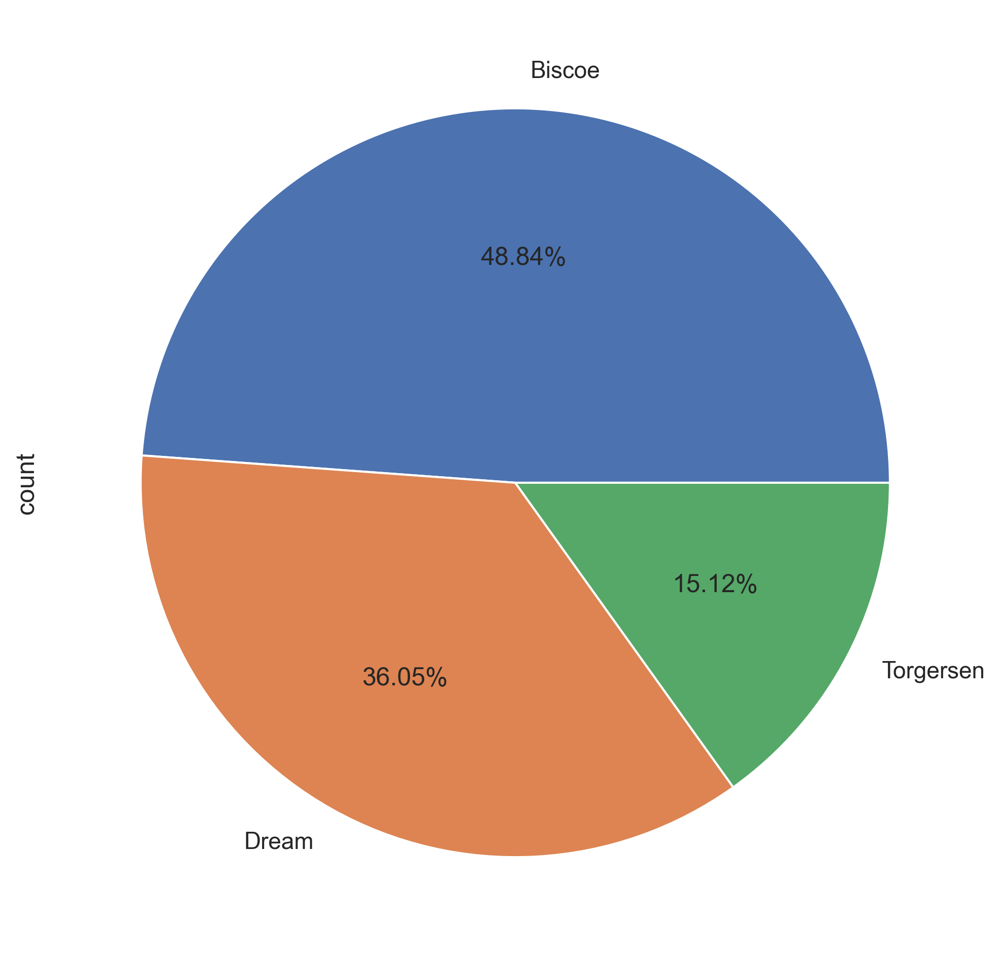

In [269]:
# Number of Island based on categories
Island=df.Island.value_counts()
Island.plot(kind='pie',autopct="%.2f%%")

In [270]:
df.Sex.value_counts()

Sex
MALE      168
FEMALE    166
Name: count, dtype: int64

In [271]:
df.shape

(344, 7)

In [272]:
df.size

2408

In [273]:
#df.isnull() 
df.isna()

,Species,Island,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex
0,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False
3,False,False,True,True,True,True,True
4,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...
339,False,False,True,True,True,True,True
340,False,False,False,False,False,False,False
341,False,False,False,False,False,False,False
342,False,False,False,False,False,False,False


In [274]:
# Drop rows with any NaN values
# df_cleaned = df.dropna()

# Drop rows where all columns are NaN
# df_cleaned = df.dropna(how='all')

# Drop columns with any NaN values
# df_cleaned = df.dropna(axis=1)

#numeric_df = df.select_dtypes(include=[np.number])

#numeric_df = df.drop('gender', axis=1) 
#df['column_name'] = pd.to_numeric(df['column_name'], errors='coerce')

#df = pd.get_dummies(df, columns=['gender'])

#df['gender'] = df['gender'].astype('category')

In [275]:
# Fill NaN with a specific value
# df = df.fillna('MALE')
df['Sex'] = df['Sex'].fillna('MALE')

# Fill NaN with the mean of the column
# df = df.fillna(df.mean())

# Fill NaN with the previous or next value
# df = df.fillna(method='ffill')  # forward fill
# df = df.fillna(method='bfill')  # backward fill

In [276]:
df.Sex.unique()

array(['MALE', 'FEMALE'], dtype=object)

In [277]:
df[df['Sex']=='']

,Species,Island,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex


In [354]:
df.groupby('Island')['Body Mass (g)'].value_counts()

Island  Body Mass (g)
0       3700.0           4
        3450.0           3
        3800.0           3
        3050.0           3
        3325.0           3
                        ..
2       3575.0           1
        3850.0           1
        2975.0           1
        2700.0           1
        4800.0           1
Name: count, Length: 151, dtype: int64

In [355]:
df.groupby('Sex')['Body Mass (g)'].value_counts()

Sex  Body Mass (g)
0    3950.0           8
     3900.0           8
     3800.0           7
     4050.0           6
     4300.0           6
                     ..
1    3275.0           1
     3425.0           1
     3475.0           1
     3575.0           1
     3625.0           1
Name: count, Length: 132, dtype: int64

In [356]:
df.groupby('Species')['Body Mass (g)'].value_counts()

Species  Body Mass (g)
0.0      3900.0           8
         3550.0           8
         3800.0           8
         3700.0           7
         3450.0           6
                         ..
1.0      3325.0           1
         3200.0           1
         2700.0           1
         2900.0           1
         4800.0           1
Name: count, Length: 89, dtype: int64

<Axes: ylabel='count'>

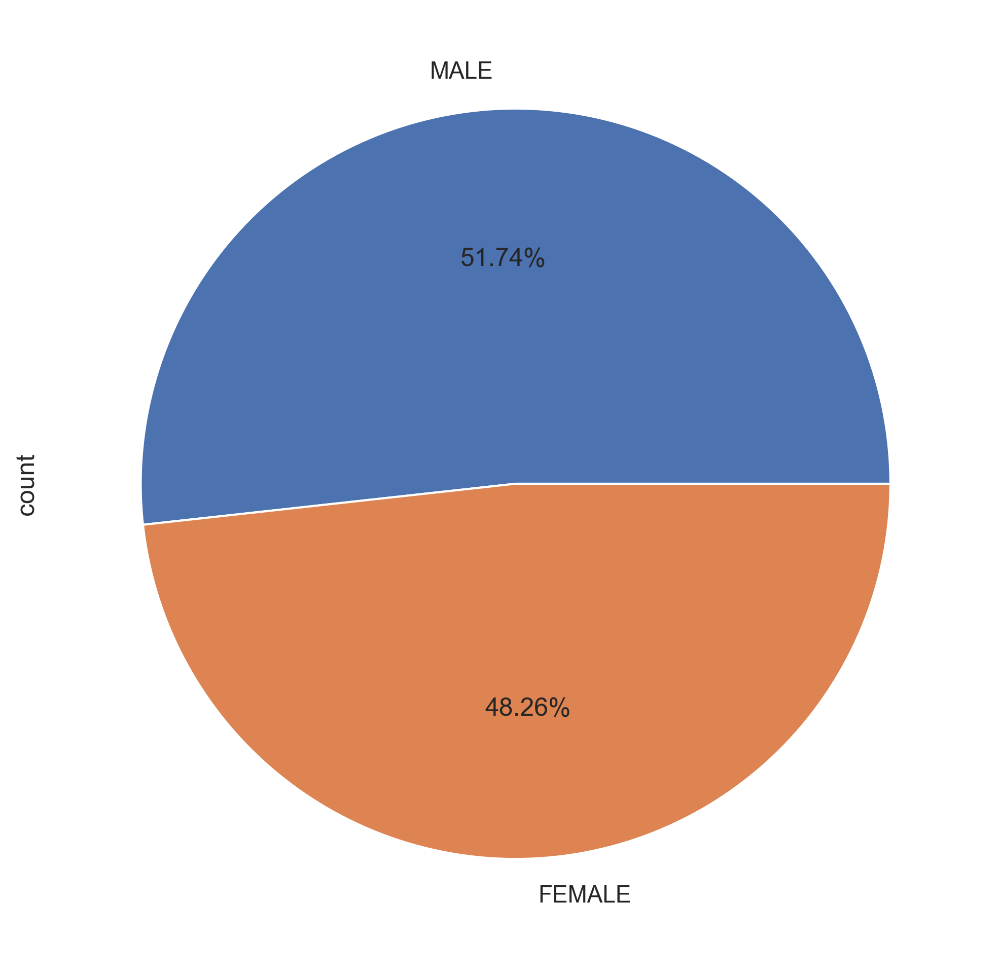

In [278]:
Sex=df.Sex.value_counts()
Sex.plot(kind='pie',autopct="%.2f%%")

In [279]:
sns.set_theme()
sns.set(rc = {"figure.figsize": (12,8), "figure.dpi" : 300})

In [280]:
import warnings
warnings.filterwarnings("ignore")

In [281]:
df.columns

Index(['Species', 'Island', 'Culmen Length (mm)', 'Culmen Depth (mm)',
       'Flipper Length (mm)', 'Body Mass (g)', 'Sex'],
      dtype='object')

In [282]:
df['Sex'] = df['Sex'].map({'MALE':0,'FEMALE':1})

In [283]:
df.head()

,Species,Island,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex
0,Adelie Penguin (Pygoscelis adeliae),Torgersen,39.1,18.7,181.0,3750.0,0
1,Adelie Penguin (Pygoscelis adeliae),Torgersen,39.5,17.4,186.0,3800.0,1
2,Adelie Penguin (Pygoscelis adeliae),Torgersen,40.3,18.0,195.0,3250.0,1
3,Adelie Penguin (Pygoscelis adeliae),Torgersen,NaN,NaN,NaN,NaN,0
4,Adelie Penguin (Pygoscelis adeliae),Torgersen,36.7,19.3,193.0,3450.0,1


In [284]:
df[df['Sex']=='MALE']

,Species,Island,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex


In [285]:
df['Sex'] = df['Sex'].astype('int32')

In [286]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Species              344 non-null    object 
 1   Island               344 non-null    object 
 2   Culmen Length (mm)   342 non-null    float64
 3   Culmen Depth (mm)    342 non-null    float64
 4   Flipper Length (mm)  342 non-null    float64
 5   Body Mass (g)        342 non-null    float64
 6   Sex                  344 non-null    int32  
dtypes: float64(4), int32(1), object(2)
memory usage: 17.6+ KB


In [287]:
df['Culmen Length (mm)'].unique()

array([39.1, 39.5, 40.3,  nan, 36.7, 39.3, 38.9, 39.2, 34.1, 42. , 37.8,
       41.1, 38.6, 34.6, 36.6, 38.7, 42.5, 34.4, 46. , 37.7, 35.9, 38.2,
       38.8, 35.3, 40.6, 40.5, 37.9, 37.2, 40.9, 36.4, 42.2, 37.6, 39.8,
       36.5, 40.8, 36. , 44.1, 37. , 39.6, 37.5, 42.3, 40.1, 35. , 34.5,
       41.4, 39. , 35.7, 41.3, 41.6, 35.5, 41.8, 33.5, 39.7, 45.8, 42.8,
       36.2, 42.1, 42.9, 35.1, 37.3, 36.3, 36.9, 38.3, 34. , 38.1, 33.1,
       43.2, 41. , 45.6, 42.7, 40.2, 35.2, 41.5, 38.5, 43.1, 36.8, 35.6,
       32.1, 40.7, 46.5, 50. , 51.3, 45.4, 52.7, 45.2, 46.1, 46.6, 51.7,
       47. , 52. , 45.9, 50.5, 50.3, 58. , 46.4, 49.2, 42.4, 48.5, 50.6,
       46.7, 49.5, 52.8, 54.2, 51. , 49.7, 47.5, 47.6, 46.9, 53.5, 49. ,
       46.2, 50.9, 45.5, 50.8, 50.1, 51.5, 49.8, 48.1, 51.4, 45.7, 50.7,
       52.2, 49.3, 50.2, 51.9, 46.8, 55.8, 43.5, 49.6, 48.7, 43.3, 48.4,
       45.1, 46.3, 44.5, 47.8, 48.2, 47.3, 59.6, 49.1, 42.6, 44.4, 44. ,
       45.3, 43.6, 44.9, 45. , 43.8, 50.4, 54.3, 47

Text(0.5, 1.0, 'Culmenl Length vs Culmen Depth')

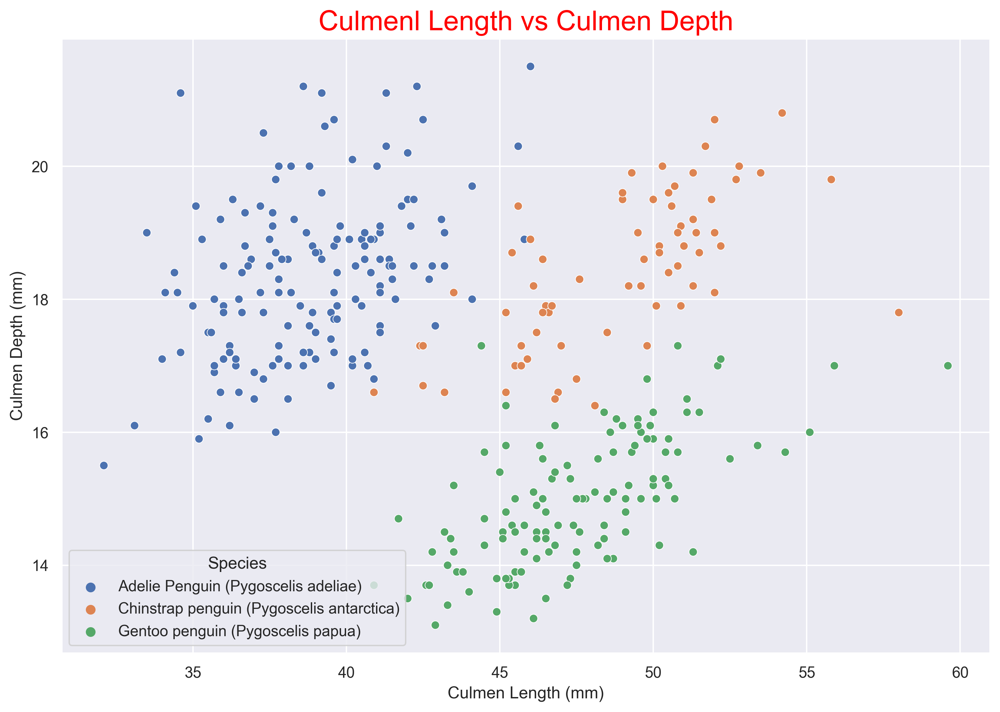

In [288]:
sns.scatterplot(x="Culmen Length (mm)", y="Culmen Depth (mm)", data=df, hue="Species")
plt.title("Culmenl Length vs Culmen Depth", size=20, color="red")

Text(0.5, 1.0, 'Culmenl Length vs Culmen Depth')

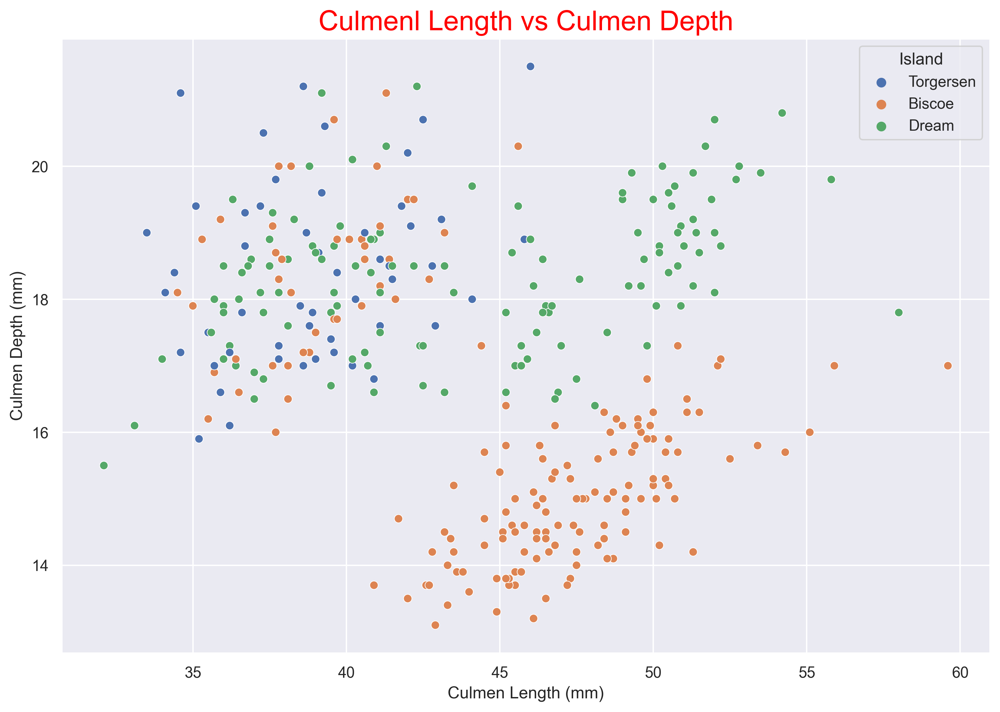

In [293]:
sns.scatterplot(x="Culmen Length (mm)", y="Culmen Depth (mm)", data=df, hue="Island")
plt.title("Culmenl Length vs Culmen Depth", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length (mm)')

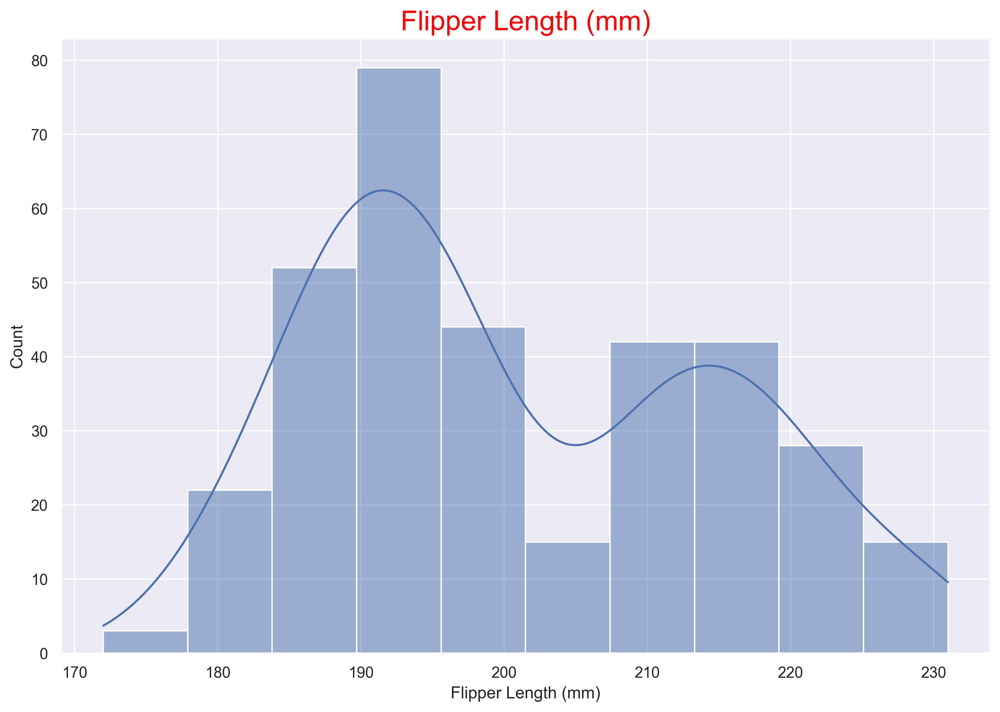

In [311]:
sns.histplot(x ="Flipper Length (mm)", data=df,kde=True)
plt.title("Flipper Length (mm)", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length')

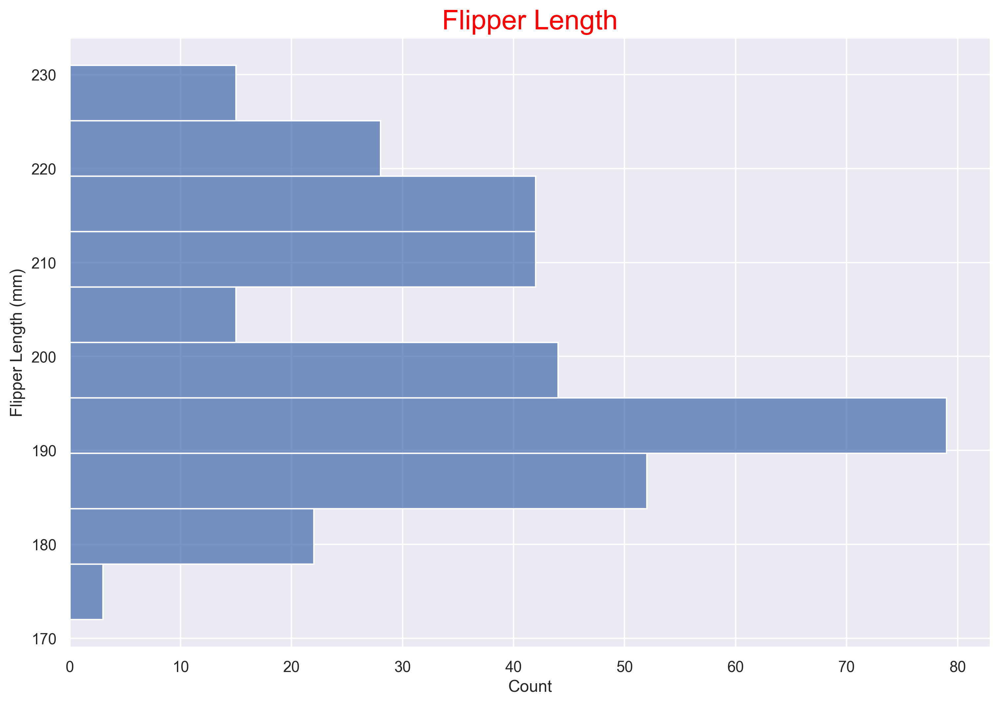

In [292]:
sns.histplot(y = "Flipper Length (mm)", data = df)
plt.title("Flipper Length", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length')

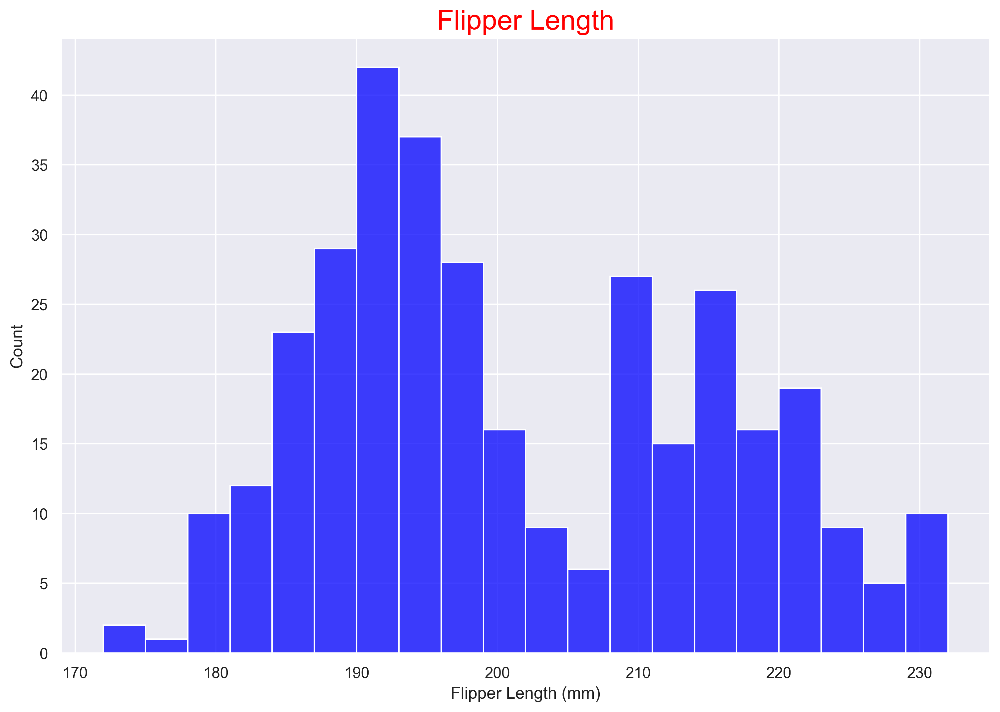

In [298]:
sns.histplot(x = "Flipper Length (mm)", data = df, binwidth=3,color='blue')
plt.title("Flipper Length", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length')

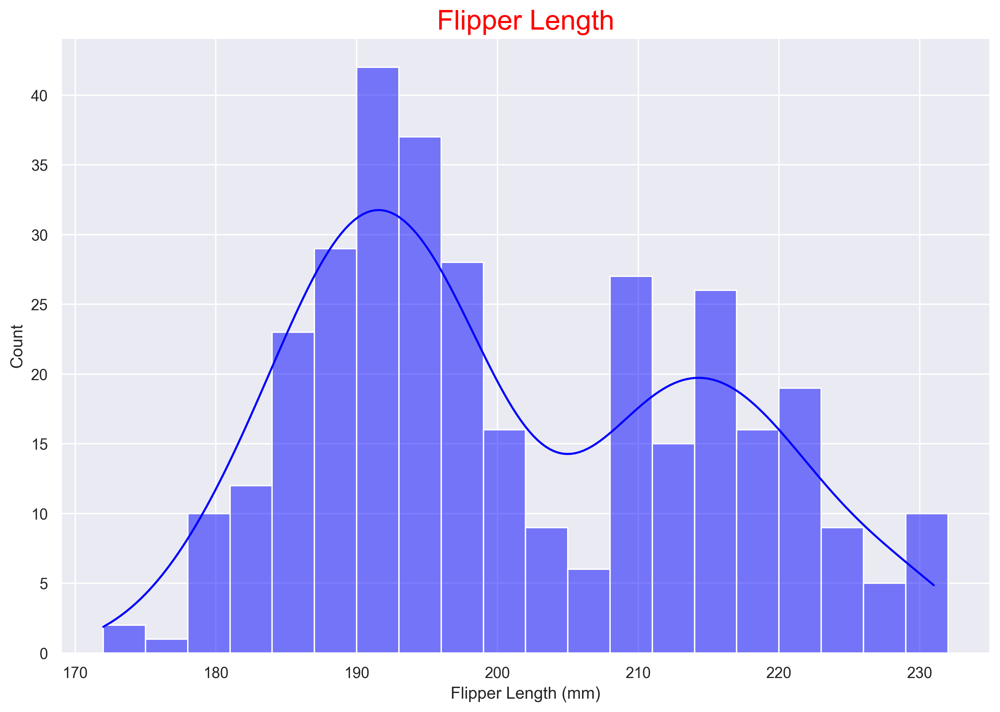

In [299]:
sns.histplot(x = "Flipper Length (mm)", data = df, binwidth=3,color='blue',kde=True)
plt.title("Flipper Length", size=20, color="red")

Text(0.5, 1.0, 'Culmen Length')

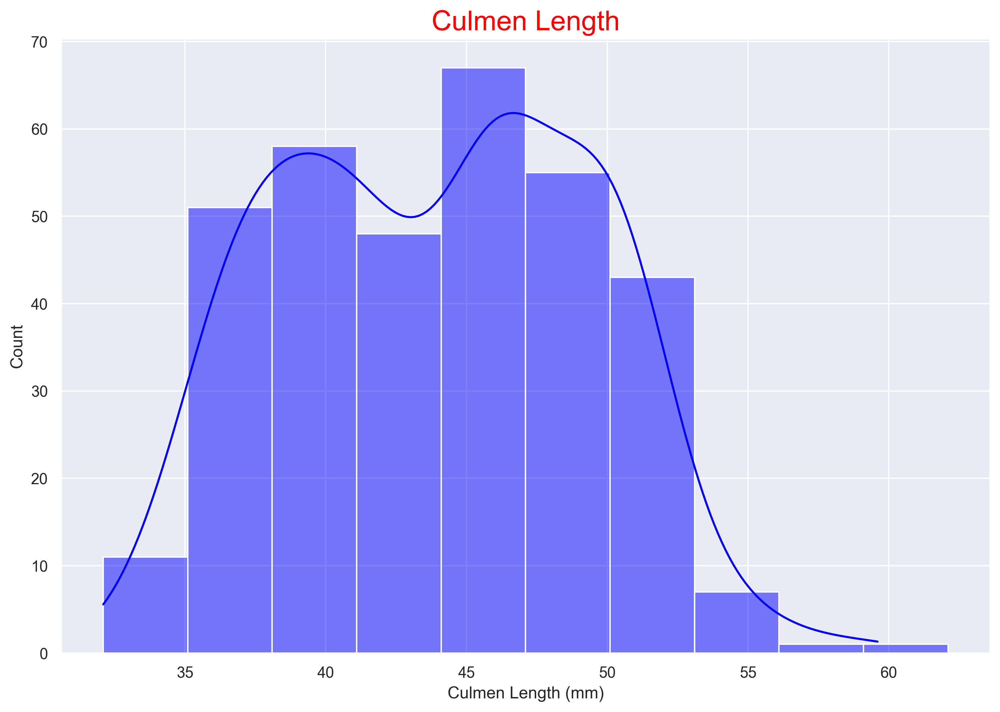

In [314]:
sns.histplot(x = "Culmen Length (mm)", data = df, binwidth=3,color='blue',kde=True)
plt.title("Culmen Length", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length')

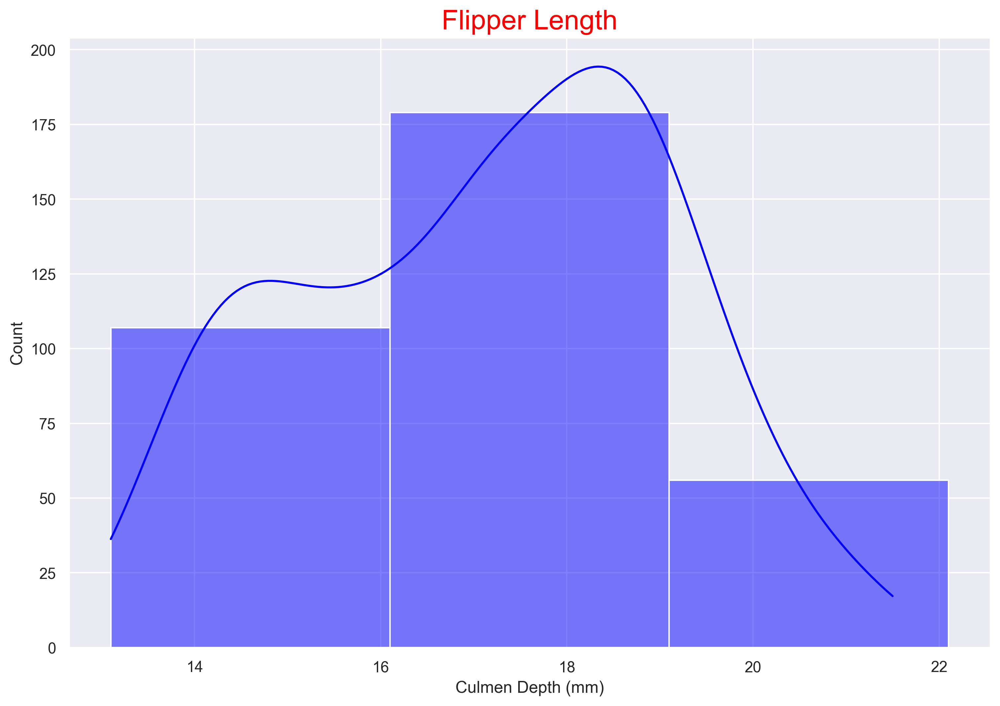

In [315]:
sns.histplot(x = "Culmen Depth (mm)", data = df, binwidth=3,color='blue',kde=True)
plt.title("Flipper Length", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length')

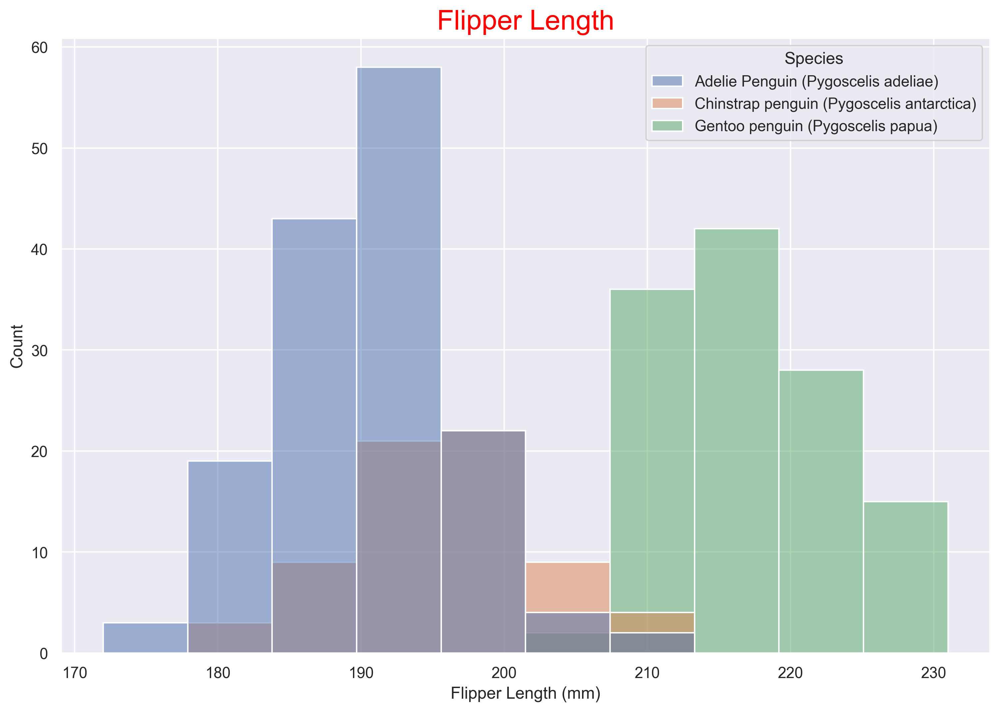

In [300]:
sns.histplot(x = "Flipper Length (mm)", data = df, hue = "Species")
plt.title("Flipper Length", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length')

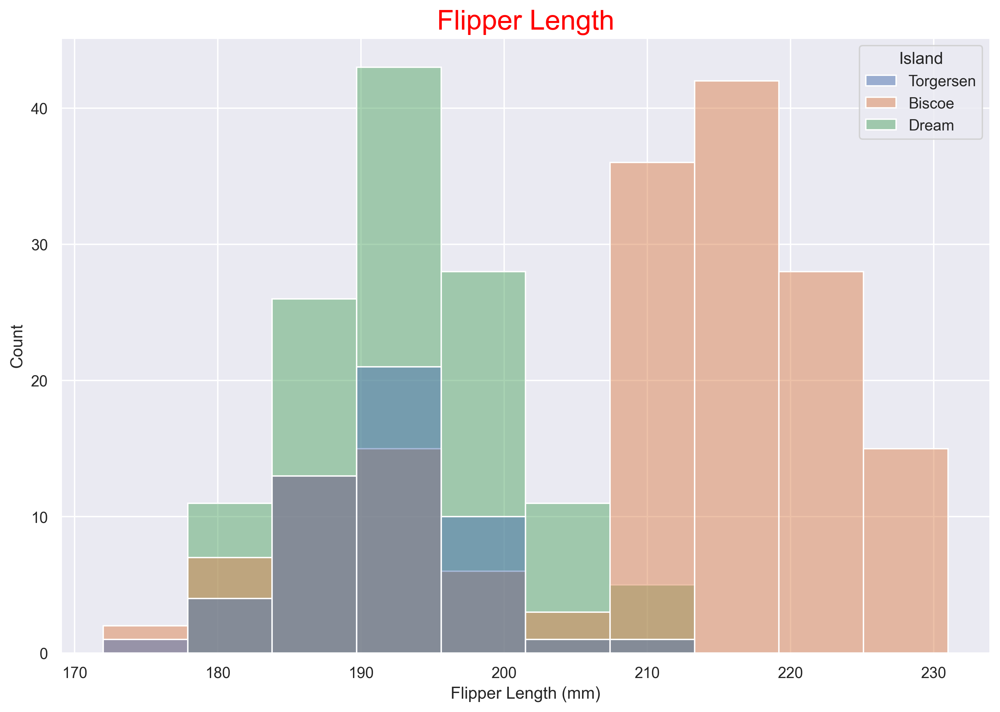

In [301]:
sns.histplot(x = "Flipper Length (mm)", data = df, hue = "Island")
plt.title("Flipper Length", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

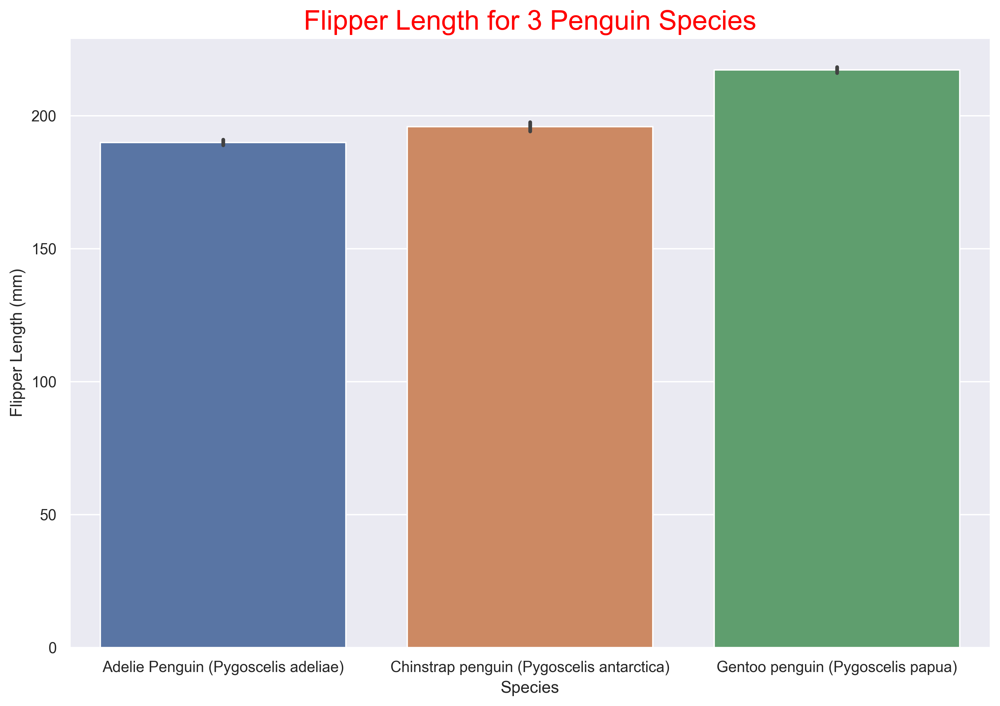

In [302]:
sns.barplot(x ="Species", y="Flipper Length (mm)", data=df)
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

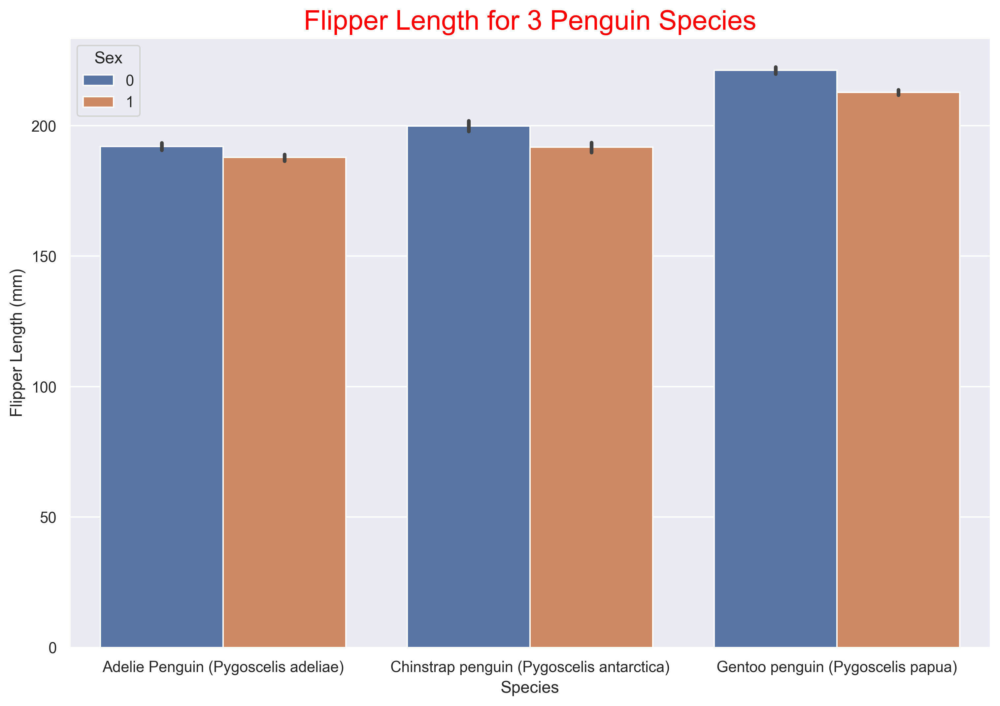

In [303]:
sns.barplot(x ="Species", y="Flipper Length (mm)", data=df,hue='Sex')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

In [304]:
df.columns

Index(['Species', 'Island', 'Culmen Length (mm)', 'Culmen Depth (mm)',
       'Flipper Length (mm)', 'Body Mass (g)', 'Sex'],
      dtype='object')

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

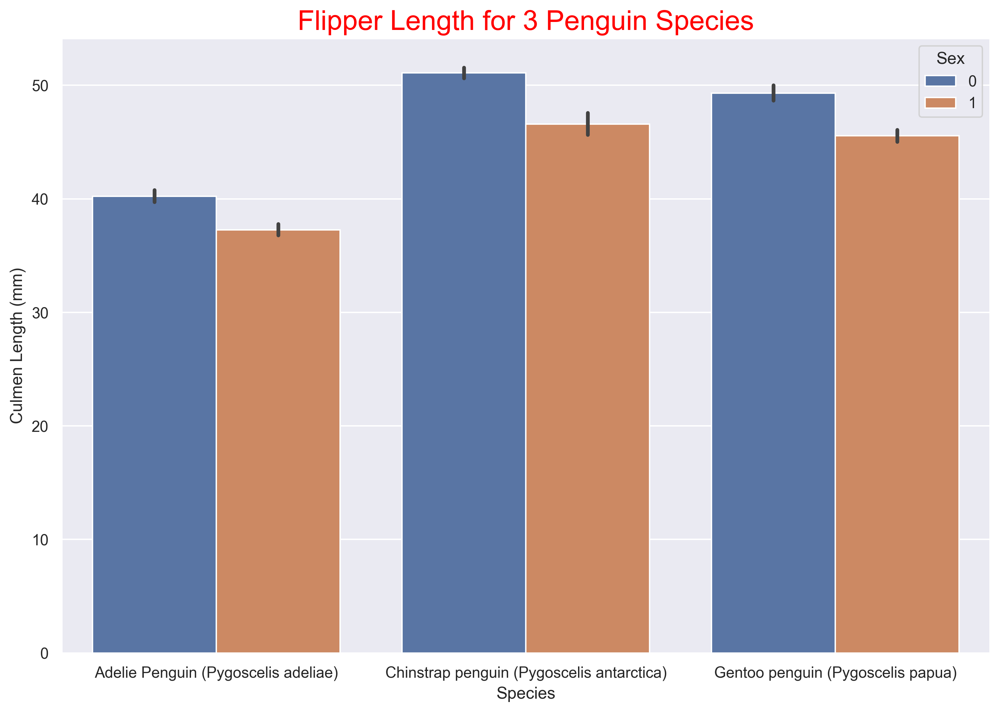

In [306]:
sns.barplot(x ="Species", y="Culmen Length (mm)", data=df,hue='Sex')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

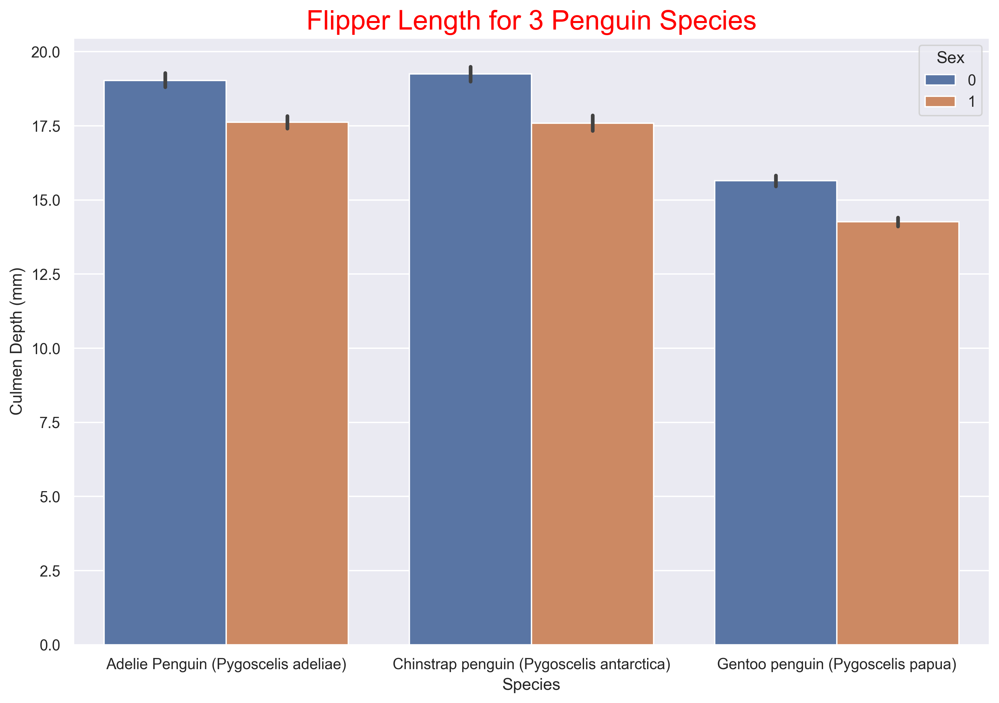

In [308]:
sns.barplot(x ="Species", y="Culmen Depth (mm)", data=df,hue='Sex')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

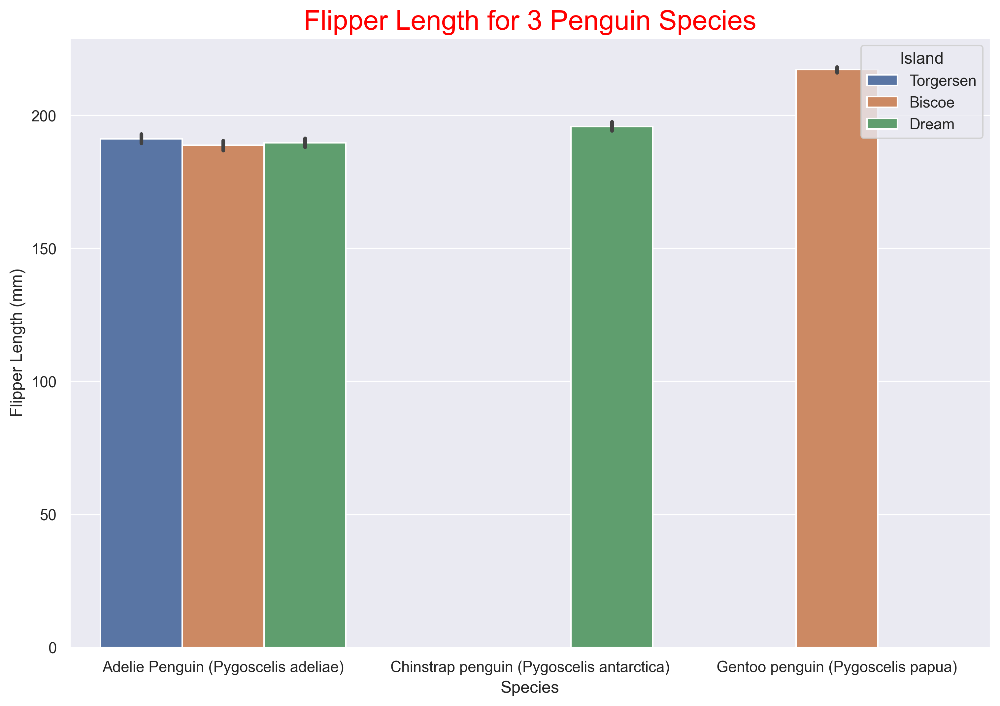

In [305]:
sns.barplot(x ="Species", y="Flipper Length (mm)", data=df,hue='Island')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

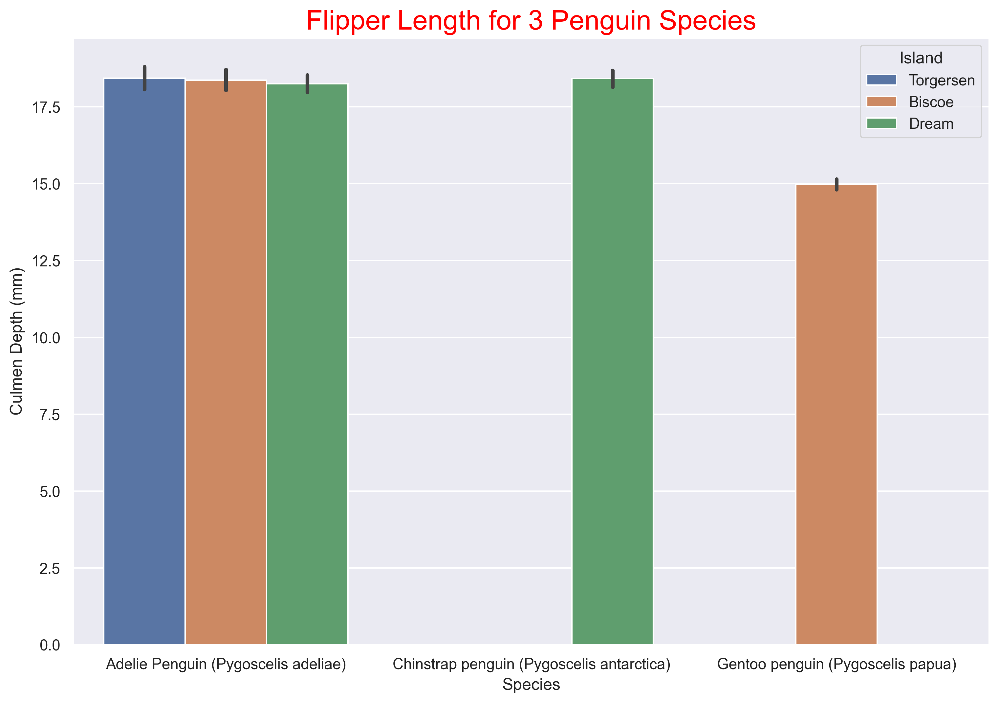

In [309]:
sns.barplot(x ="Species", y="Culmen Depth (mm)", data=df,hue='Island')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

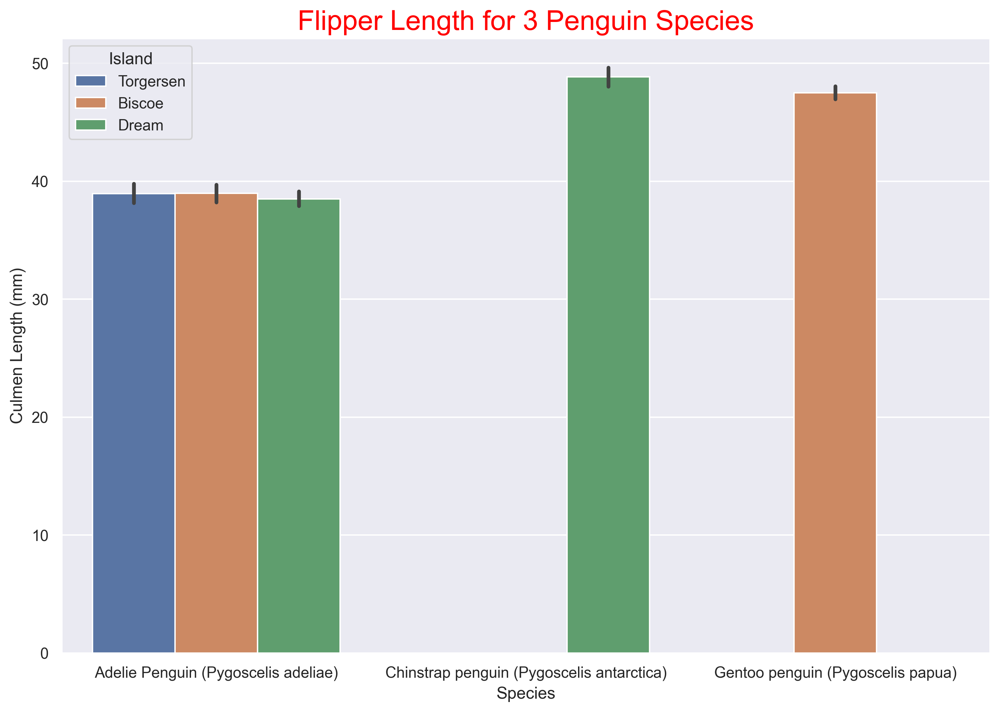

In [310]:
sns.barplot(x ="Species", y="Culmen Length (mm)", data=df,hue='Island')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

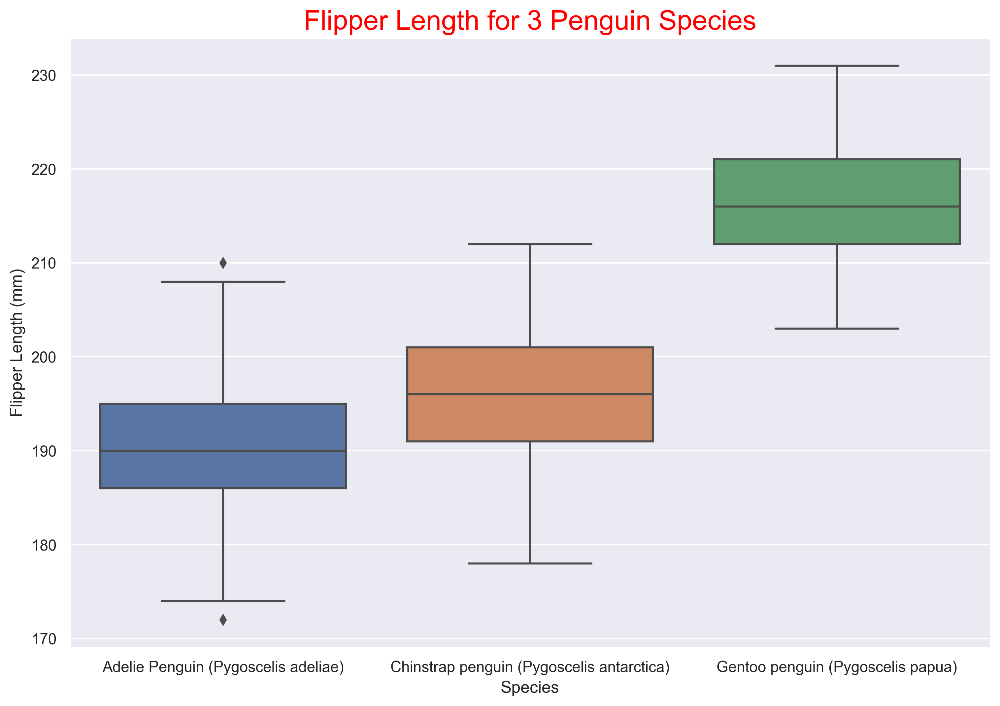

In [316]:
sns.boxplot(x = "Species", y = "Flipper Length (mm)", data =df)
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

<Axes: >

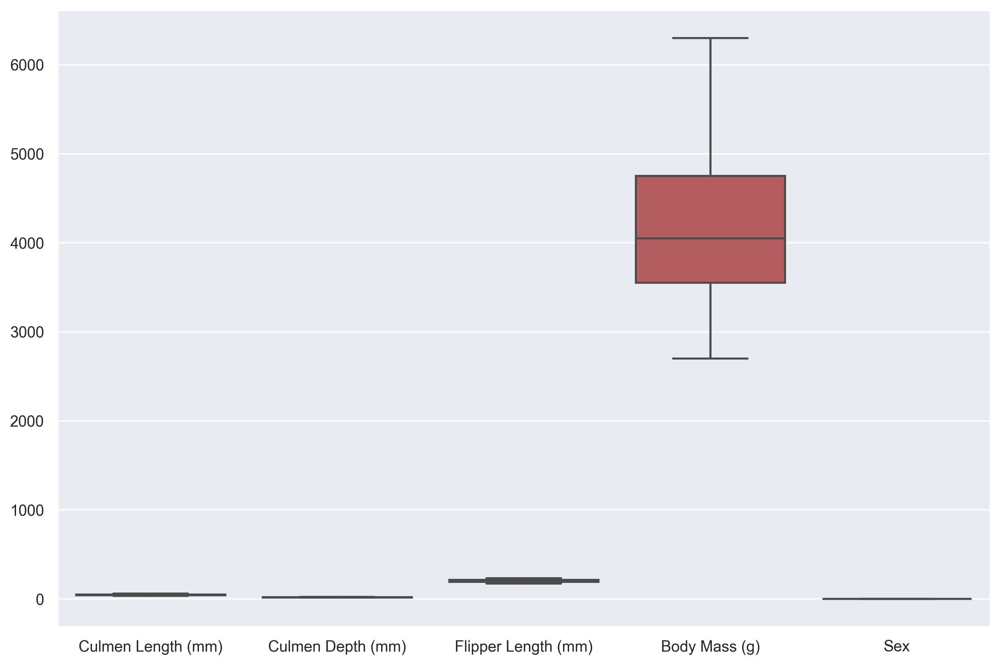

In [319]:
sns.boxplot(df)

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

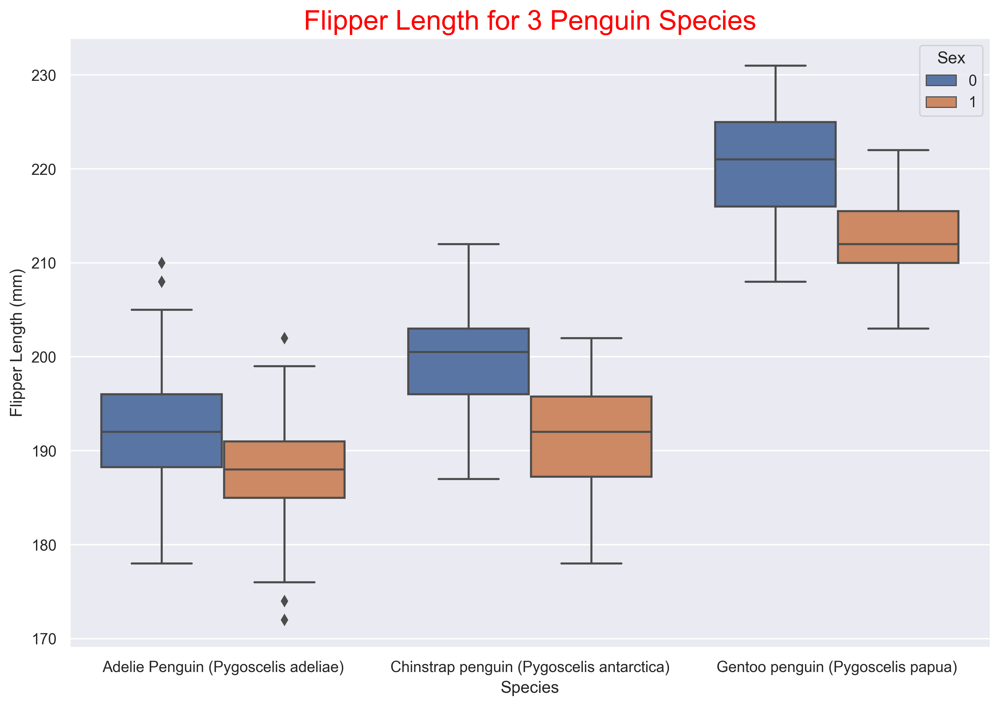

In [320]:
sns.boxplot(x = "Species", y = "Flipper Length (mm)", data =df,hue='Sex')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

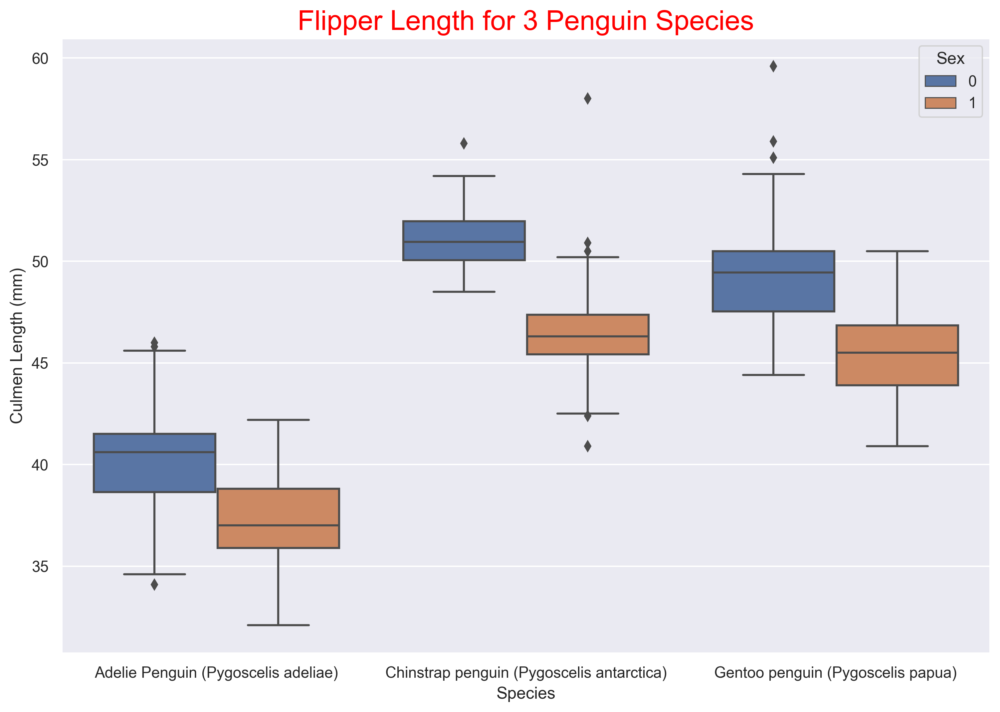

In [321]:
sns.boxplot(x = "Species", y = "Culmen Length (mm)", data =df,hue='Sex')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

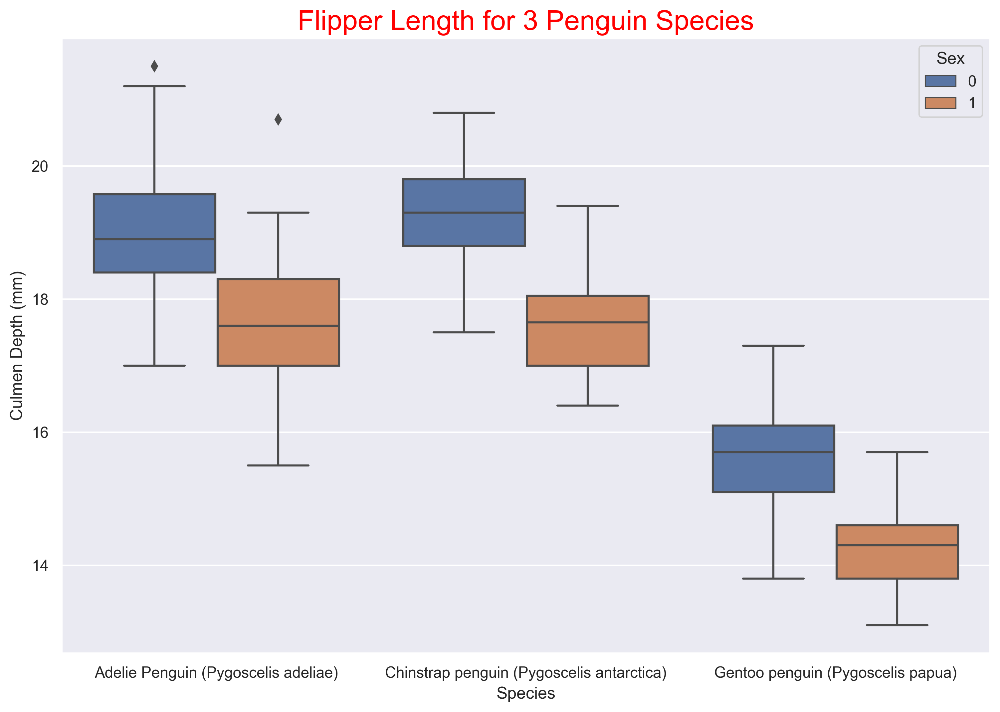

In [322]:
sns.boxplot(x = "Species", y = "Culmen Depth (mm)", data =df,hue='Sex')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

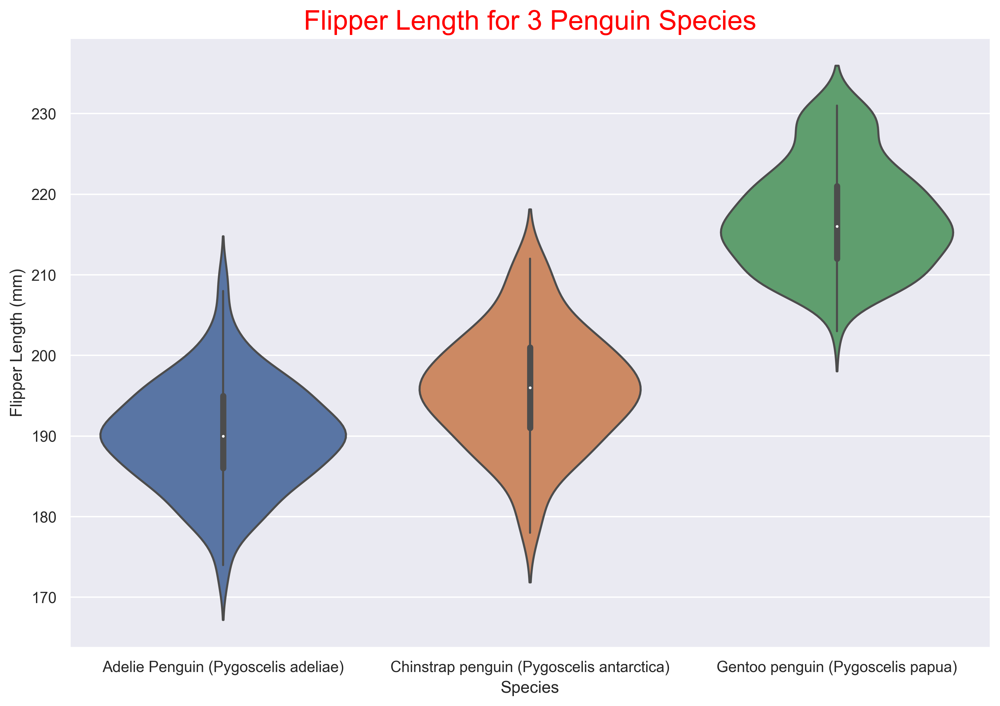

In [325]:
sns.violinplot(x = "Species", y = "Flipper Length (mm)", data = df)
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

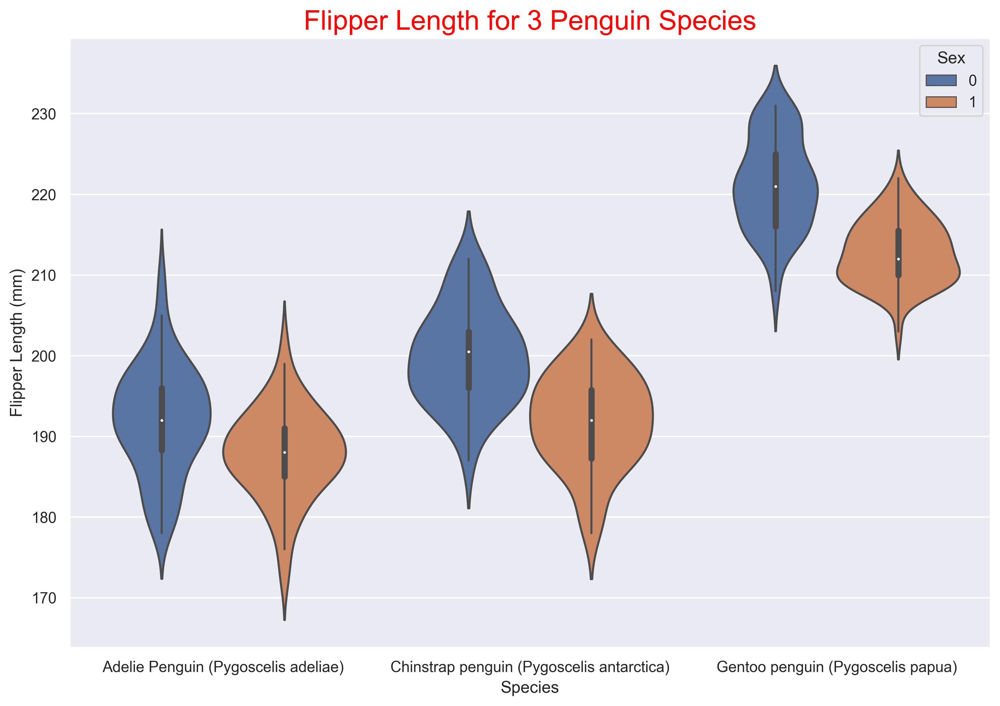

In [326]:
sns.violinplot(x = "Species", y = "Flipper Length (mm)", data = df,hue='Sex')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

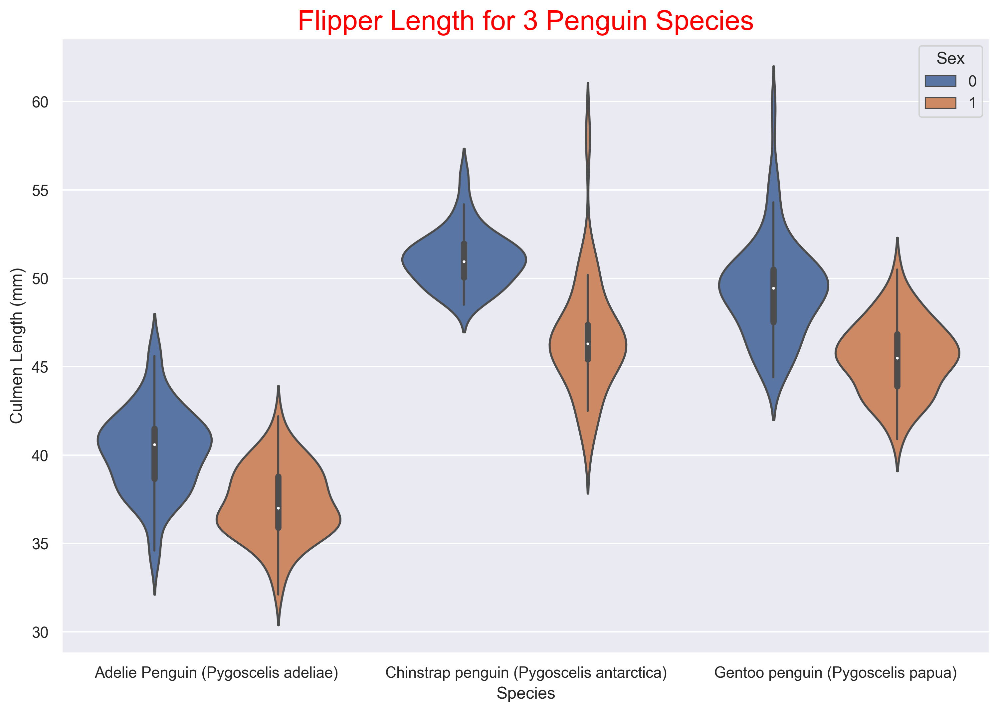

In [327]:
sns.violinplot(x = "Species", y = "Culmen Length (mm)", data = df,hue='Sex')
plt.title("Flipper Length for 3 Penguin Species", size=20, color="red")

Text(0.5, 1.0, 'Flipper Length for 3 Penguin Species')

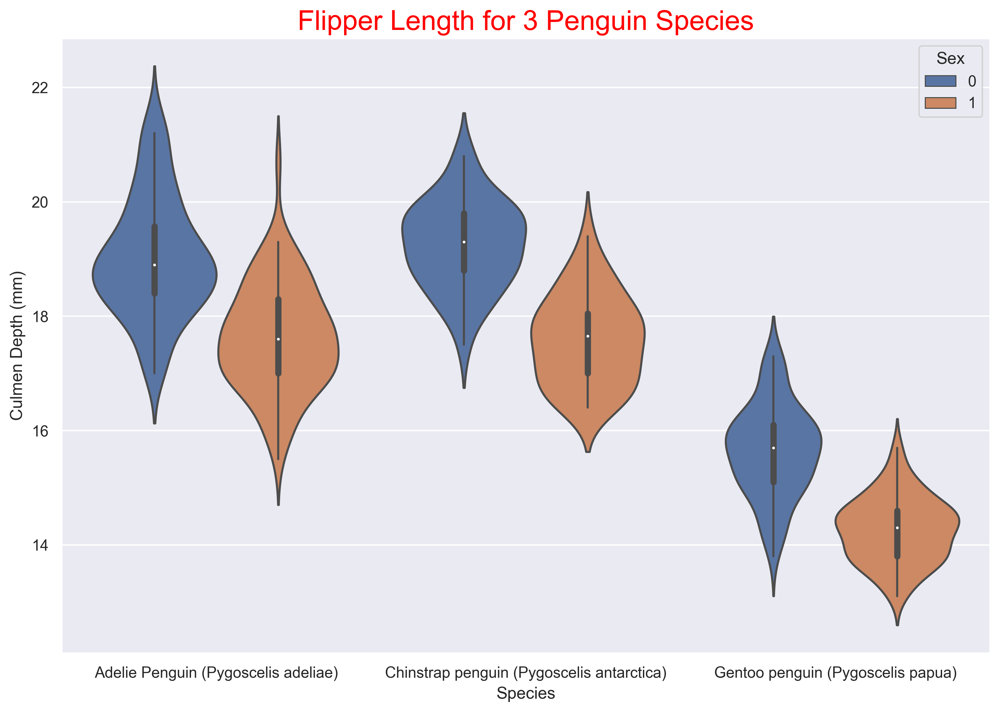

In [328]:
sns.violinplot(x = "Species", y = "Culmen Depth (mm)", data = df,hue='Sex')
plt.title("Culmen Depth for 3 Penguin Species", size=20, color="red")

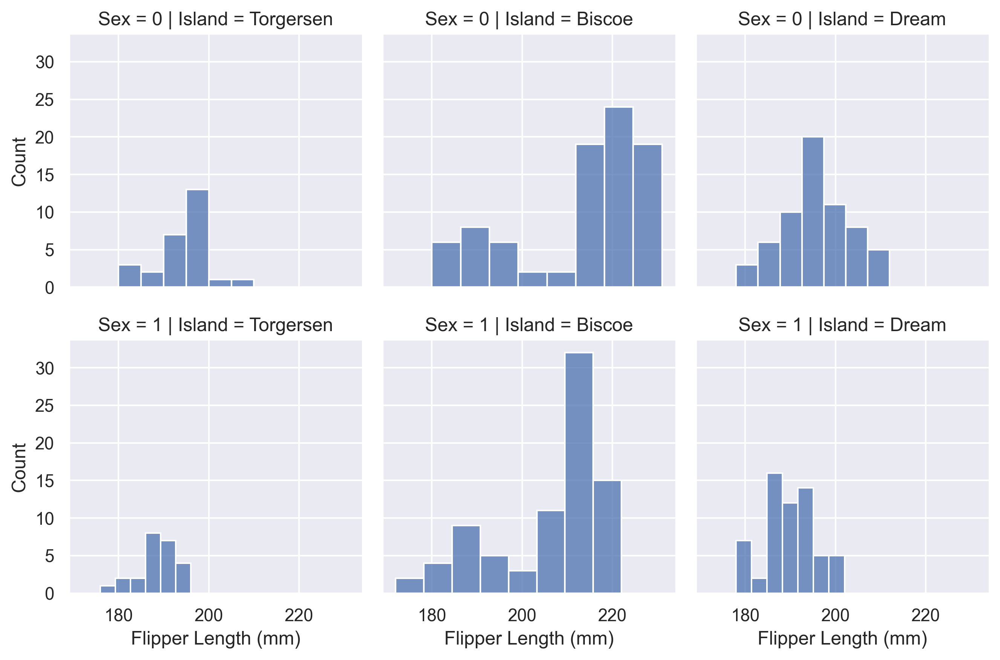

In [330]:
sns.FacetGrid(df, col="Island", row="Sex").map(sns.histplot, "Flipper Length (mm)")

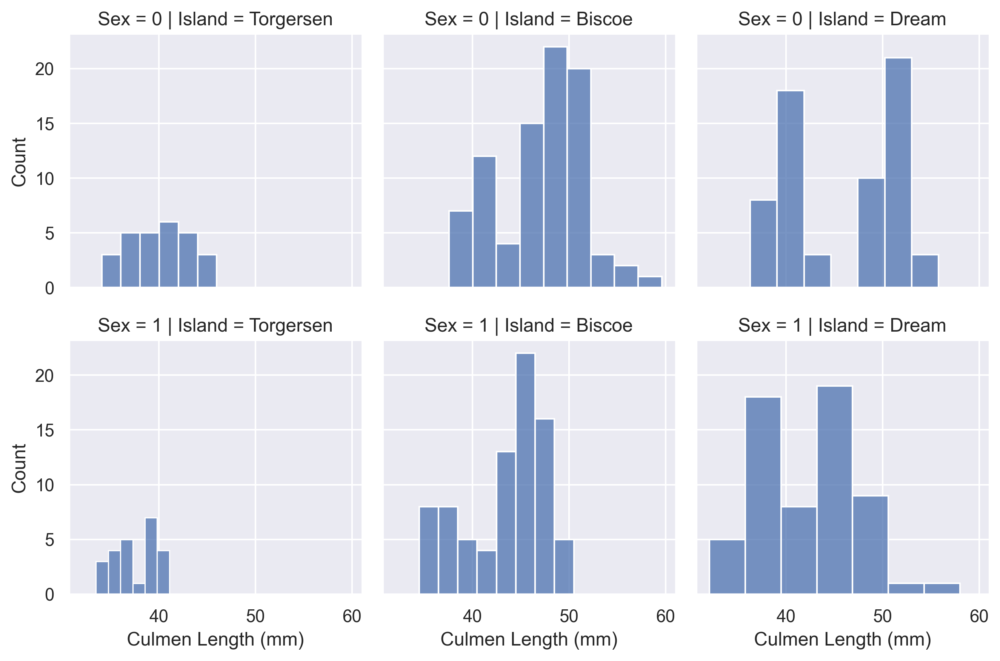

In [332]:
sns.FacetGrid(df, col="Island", row="Sex").map(sns.histplot, "Culmen Length (mm)")

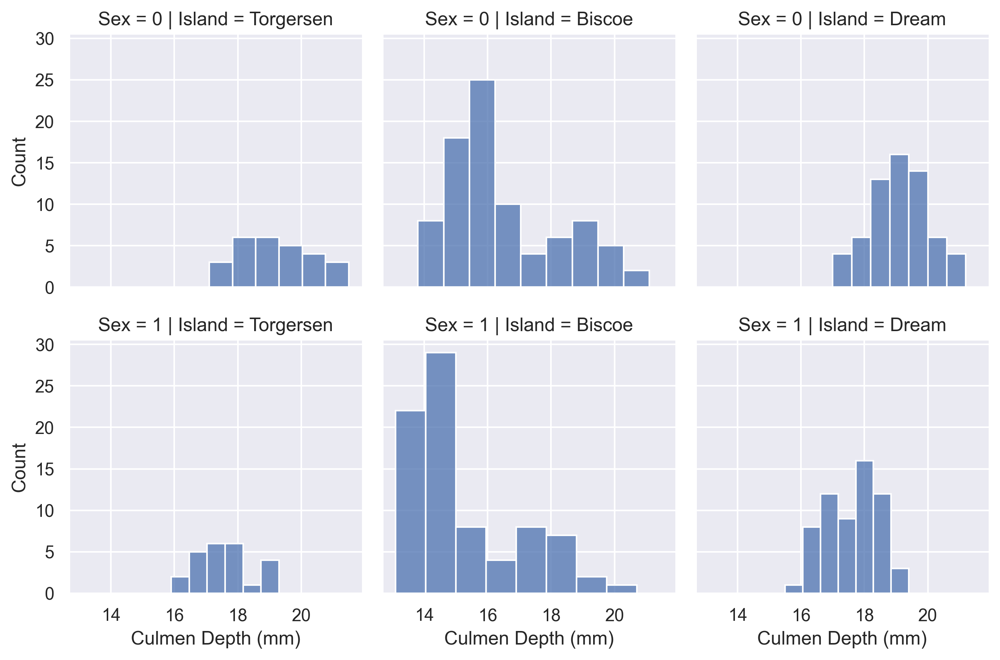

In [333]:
sns.FacetGrid(df, col="Island", row="Sex").map(sns.histplot, "Culmen Depth (mm)")

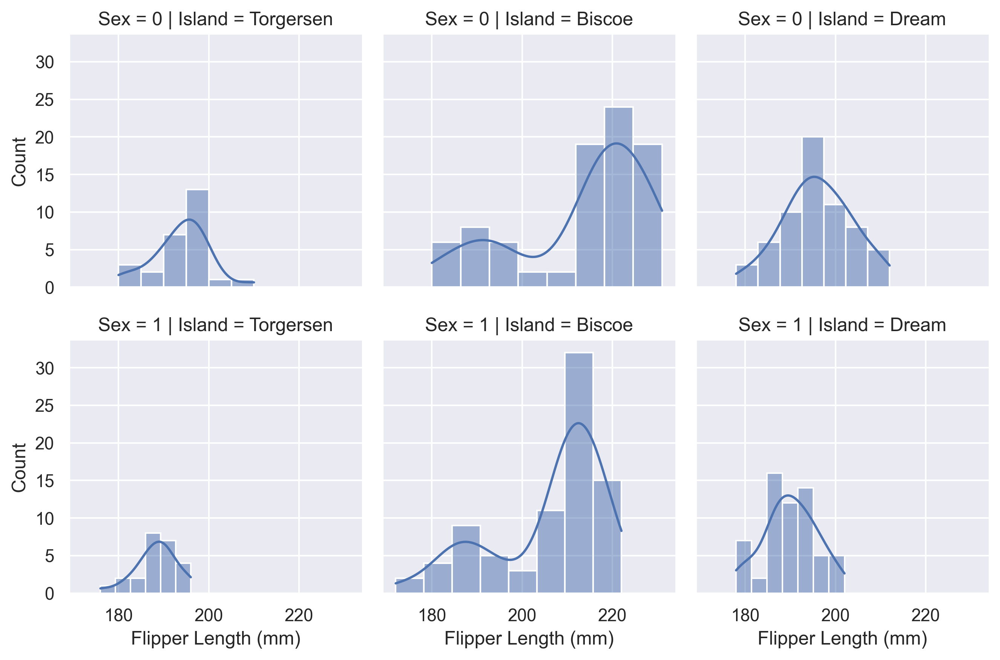

In [339]:
#sns.FacetGrid(df, col = "Island", row = "Sex").map(sns.distplot, "Flipper Length (mm")
sns.FacetGrid(df, col = "Island", row = "Sex").map(sns.histplot, "Flipper Length (mm)",kde=True)


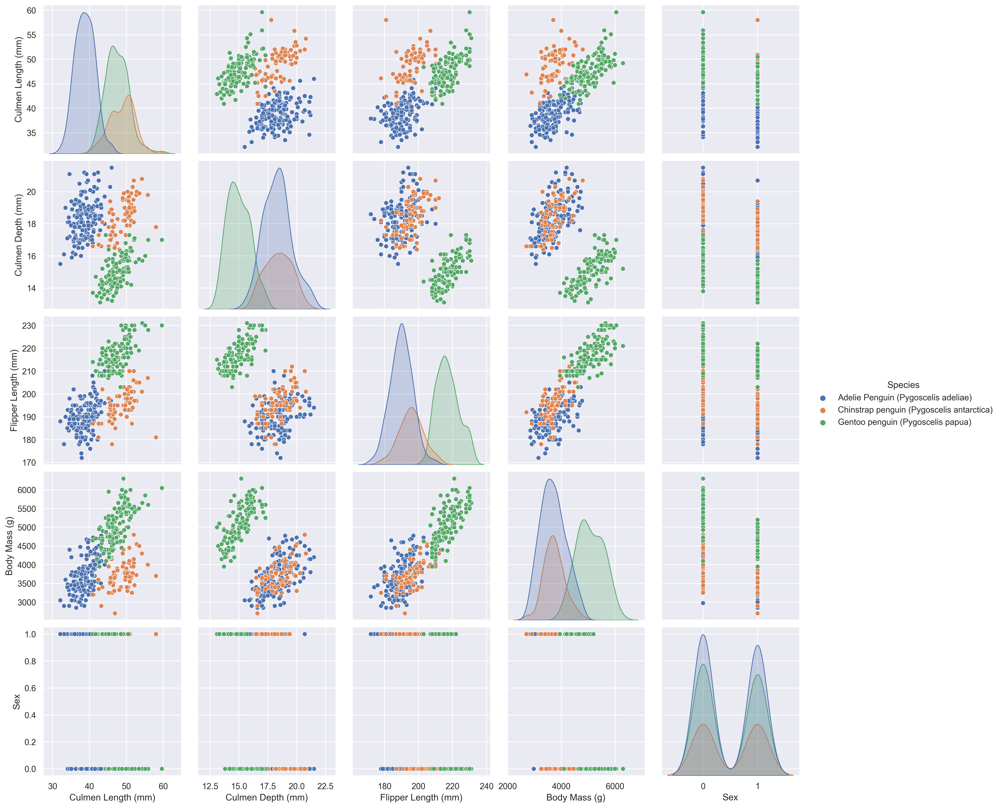

In [340]:
sns.pairplot(df, hue = "Species", height=3) # diag_kind="hist"

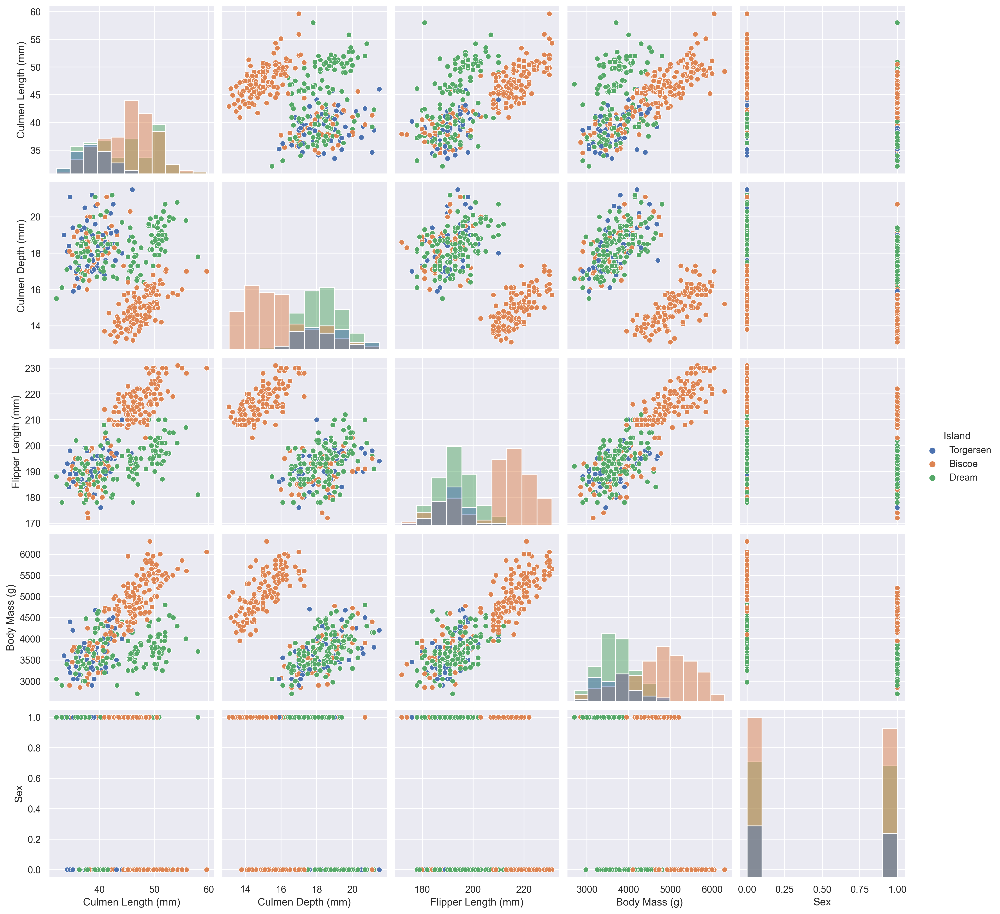

In [342]:
sns.pairplot(df, hue = "Island", height=3,diag_kind="hist") 

In [344]:
df.columns

Index(['Species', 'Island', 'Culmen Length (mm)', 'Culmen Depth (mm)',
       'Flipper Length (mm)', 'Body Mass (g)', 'Sex'],
      dtype='object')

In [349]:
df['Island'].unique()

array(['Torgersen', 'Biscoe', 'Dream'], dtype=object)

In [ ]:

# Adelie Penguin (Pygoscelis adeliae)( 0), Chinstrap penguin (Pygoscelis antarctica) (1), entoo penguin (Pygoscelis papua) (2)

# Torgersen (0),Biscoe(1),Dream( 2)

In [350]:
df['Species'] = df['Species'].map({'Adelie Penguin (Pygoscelis adeliae)':0,'Chinstrap penguin (Pygoscelis antarctica)':1,'entoo penguin (Pygoscelis papua)':2})

df['Island'] = df['Island'].map({'Torgersen':0,'Biscoe':1,'Dream':2})

<Axes: >

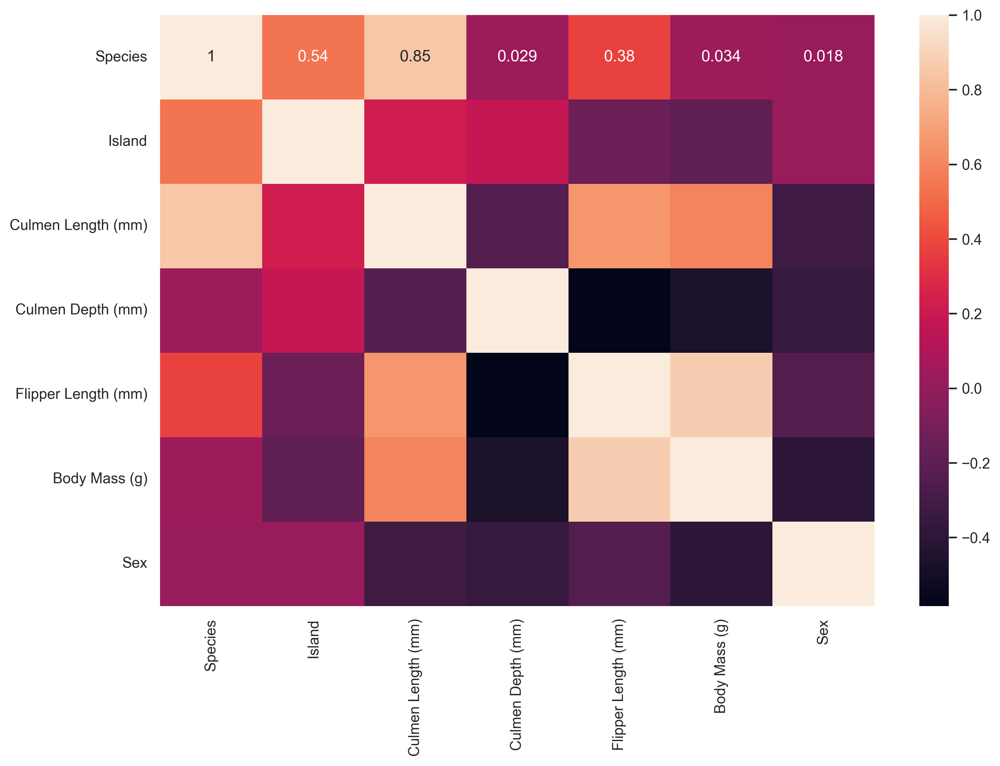

In [351]:
sns.heatmap(df.corr(), annot = True)

In [ ]:
# Conclusion about above Analaytics and visulazation


# 1. Adelie penguin ( Species ) value is high 

# 2. Island Biscoe Categories  count value is high 

# 3. Body Mass (g) is  high based on  Species(Adelie Penguin), Sex(MALE), Island(Torgersen)

# 4. Male Categories is high comparing to Female 

# High corrlation between Culmen Length (mm)" and Culmen Depth (mm)

# 5. "Culmen Depth (mm) Length is high for Adelie Penguin 

# 6. Culmen Length (mm) & Culmen Depth  is high for Chinstrap penguin

# 7. Culmen Length (mm) is high for Gentoo penguin

# 8. Above 190 mm and below 200 mm flipper lenght is high countable

# 9. Gentoo penguin Flipper Lenght is high and Culmen Depth (mm) is low & Culmen is low for Adelie Penguin

# 10. Island ( Biscoe ) Flipper Lenght (mm) , Culmen Length (mm) , Culmen Depth (mm) is high for FEMALE 

# 11. 


# Adelie Penguin (Pygoscelis adeliae)( 0), Chinstrap penguin (Pygoscelis antarctica) (1), Gentoo penguin (Pygoscelis papua) (2)

# Torgersen (0),Biscoe(1),Dream( 2)

